# Maximum Expected Coverage Location Problem（MEXCLP）

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Problem-Description" data-toc-modified-id="Problem-Description-1">Problem Description</a></span><ul class="toc-item"><li><span><a href="#p-Median" data-toc-modified-id="p-Median-1.1">p Median</a></span></li><li><span><a href="#Integer-programming-model:" data-toc-modified-id="Integer-programming-model:-1.2">Integer programming model:</a></span></li></ul></li><li><span><a href="#Setup" data-toc-modified-id="Setup-2">Setup</a></span></li><li><span><a href="#Example" data-toc-modified-id="Example-3">Example</a></span><ul class="toc-item"><li><span><a href="#Random-Data" data-toc-modified-id="Random-Data-3.1">Random Data</a></span></li><li><span><a href="#Road-Network-Data" data-toc-modified-id="Road-Network-Data-3.2">Road Network Data</a></span></li></ul></li></ul></div>

## Problem Description

# Maximum Expected Coverage Location Problem（MEXCLP）
Daskin根据MCLP公式开发了MEXCLP，MEXCLP假设每个应急设施的繁忙概率相同。MEXCLP是一个整数线性规划模型，它允许在每个需求点分配一个以上的应急设施。MEXCLP是通过在一个需求点放置k个应急设施来制定的，目的是最大限度地满足预期需求。MEXCLP的目标函数如（1）所示。公式（1）描述了在相应响应时间/距离内k个应急设施能够覆盖的节点i处的需求的数量。该目标函数旨在最大化节点的需求和覆盖可靠性之和。系统约束如从（2）到（5）所示。约束条件（3）将在j处可分配的应急设施的数量限制为至多p个。同时，（4）和（5）示出了Xj和Yj，k被设置为0或1，其指示决策变量。MEXCLP公式为：

$\begin{array} \displaystyle \textbf{Maximize} & Z\;=\;\sum_{i=1}^{n} \sum_{k=1}^{p} {d_i q_{k} Y_{i,k}}&& (1)\\
\\
\displaystyle \textbf{Subject to:} 
            & \sum_{j\in N_i}^{} X_j - \sum_{k=1}^{p}kY_{i,k} \le 0 & ,i=1,...,n& (2)\\
            & \sum_{j=1}^{m}X_{j} \;\le\; p & ,j=1,...,m& (3)\\
            & X_{j}\; =\; 0, 1 & ,j=1,...,n& (4)\\
            & Y_{i,k} \;= \;0, 1 & ,i=1,...,n\quad k=1,...,p& (5)\\
            \end{array}$

$\begin{array} \displaystyle \textbf{Where:}\\ & & \displaystyle Z & \small = & \textrm{预期需求覆盖} \\
& & d_{i} & \small = & \textrm{节点i的需求量 }  \\
& & N_{i} & \small = & \textrm{可以覆盖节点i的需求点集合 }  \\
& & p & \small = & \textrm{应急设施数量} \\
& & q_k & \small = & \textrm{给定k个设施的覆盖可靠性} \\
& & X_{j} & \small = & \begin{cases}
              1, \textrm{当前节点j有应急设施} \\
              0, \textrm{其他} \\
           \end{cases} \\ 
& & Y_{j,k} & \small = & \begin{cases}
              1, \textrm{节点i被k个应急设施覆盖 }\\
              0, \textrm{其他}
           \end{cases} \\
\end{array}$


## Setup

In [1]:
import random
from itertools import product
import numpy as np
from location.CModel import *
from location.PModel import *
import pandas as pd
import osmnx as ox

## Example

### Random Data

In [2]:
np.random.seed(0) # random seed

solver_list = listSolvers(onlyAvailable=True)
print(solver_list)

No parameters matching '_test' found
['CPLEX_CMD', 'GUROBI', 'GUROBI_CMD', 'PULP_CBC_CMD']


In [3]:
n_points = 20
prob = 0.2
p = 4
radius = 0.2
num_people = np.random.randint(1, 10, size=n_points)
points = [(random.random(), random.random()) for i in range(n_points)]
points_np = np.array(points)
A = np.sum((points_np[:, np.newaxis, :] - points_np[np.newaxis, :, :]) ** 2, axis=-1) ** 0.5
mask = A <= radius
A[mask] = 1
A[~mask] = 0

In [4]:
selected, served, obj = MaximumExpectedCoverageLocation(demand=num_people,
                                                        unprob_rate=prob,
                                                        num_located=p,
                                                        num_points=n_points,
                                                        cover=A,
                                                        solver=PULP_CBC_CMD()).prob_solve()

Status: Optimal
Selected position =  [0, 19, 7, 9]
Objective function value =  62.4
Unreliability rate =  0.2


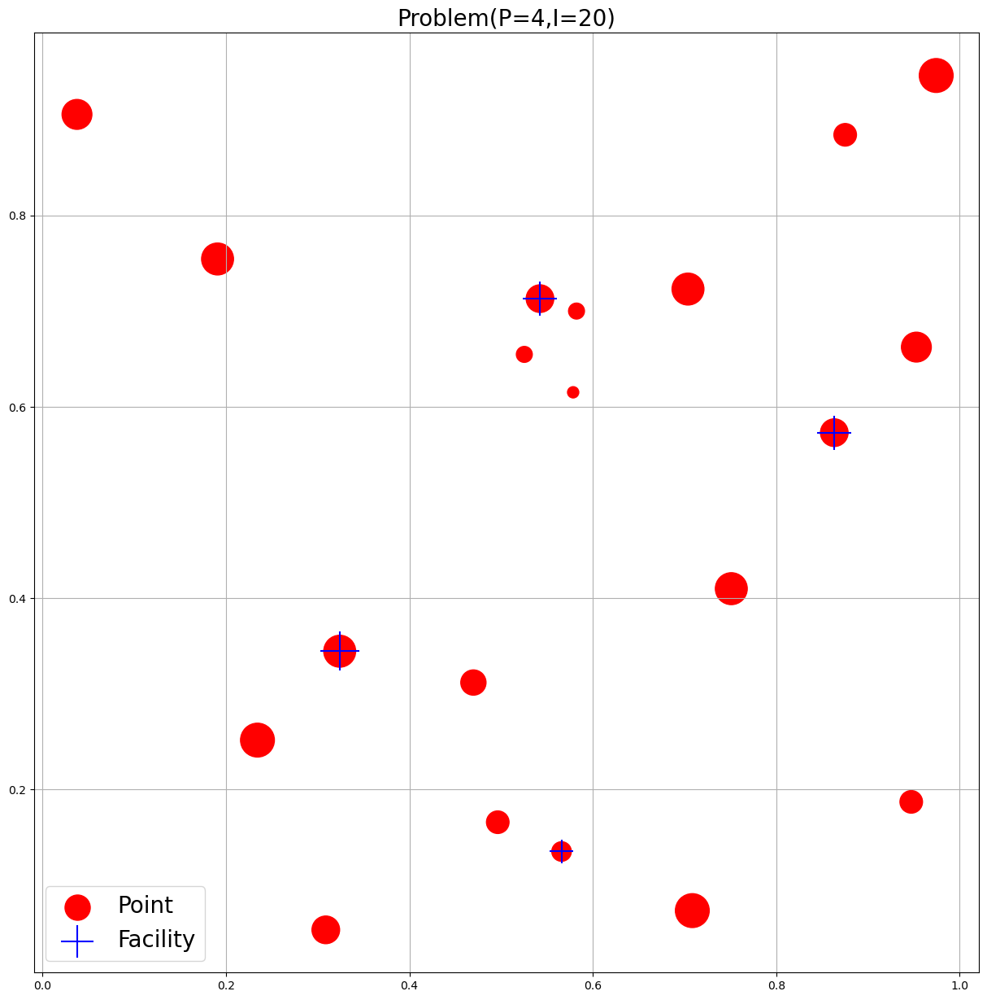

In [5]:
#Image representation
plt.figure(figsize=(15,15))
name = 'Problem(P=' + str(p) + ',I=' + str(n_points) + ')'
plt.title(name, fontsize = 20)
#Points
# points_np.plot(color='red', markersize=num_people*2, label="Point")
plt.scatter(points_np[:, 0], points_np[:, 1], c='red', s=num_people*100, label="Point")
plt.scatter(points_np[selected, 0], points_np[selected, 1], c='blue', marker='+', s=num_people[selected]*100, label="Facility")
plt.grid(True)   
plt.legend(loc='best', fontsize = 20)
plt.show()

### Road Network Data

In [6]:
df = pd.read_csv('E:\桌面\wheel\data\北京POI裁剪.csv',encoding='gbk')
df = df.query('adname=="东城区" | adname=="西城区" | adname=="朝阳区" | adname=="海淀区"').reset_index(drop=True)
data = df[['long', 'lat']]
num_points = df.shape[0]
num_located = 10
prob = 0.2
np.random.seed(0)
num_people = np.random.randint(1,10, size=num_points)
cartesian_prod = list(product(range(num_points), range(num_points)))
points = [(data['long'][i], data['lat'][i]) for i in range(num_points)]

In [7]:
radius = 0.03
points_np = np.array(points)
A = np.sum((points_np[:, np.newaxis, :] - points_np[np.newaxis, :, :]) ** 2, axis = -1) ** 0.5
mask = A <= radius
A[mask] = 1
A[~mask] = 0

In [8]:
selected, served, obj = MaximumExpectedCoverageLocation(demand=num_people,
                                                        unprob_rate=prob,
                                                        num_located=num_located,
                                                        num_points=num_points,
                                                        cover=A,
                                                        solver=PULP_CBC_CMD()).prob_solve()

Status: Optimal
Selected position =  [103, 115, 30, 63, 64, 80, 81, 87, 9, 99]
Objective function value =  424.992
Unreliability rate =  0.2


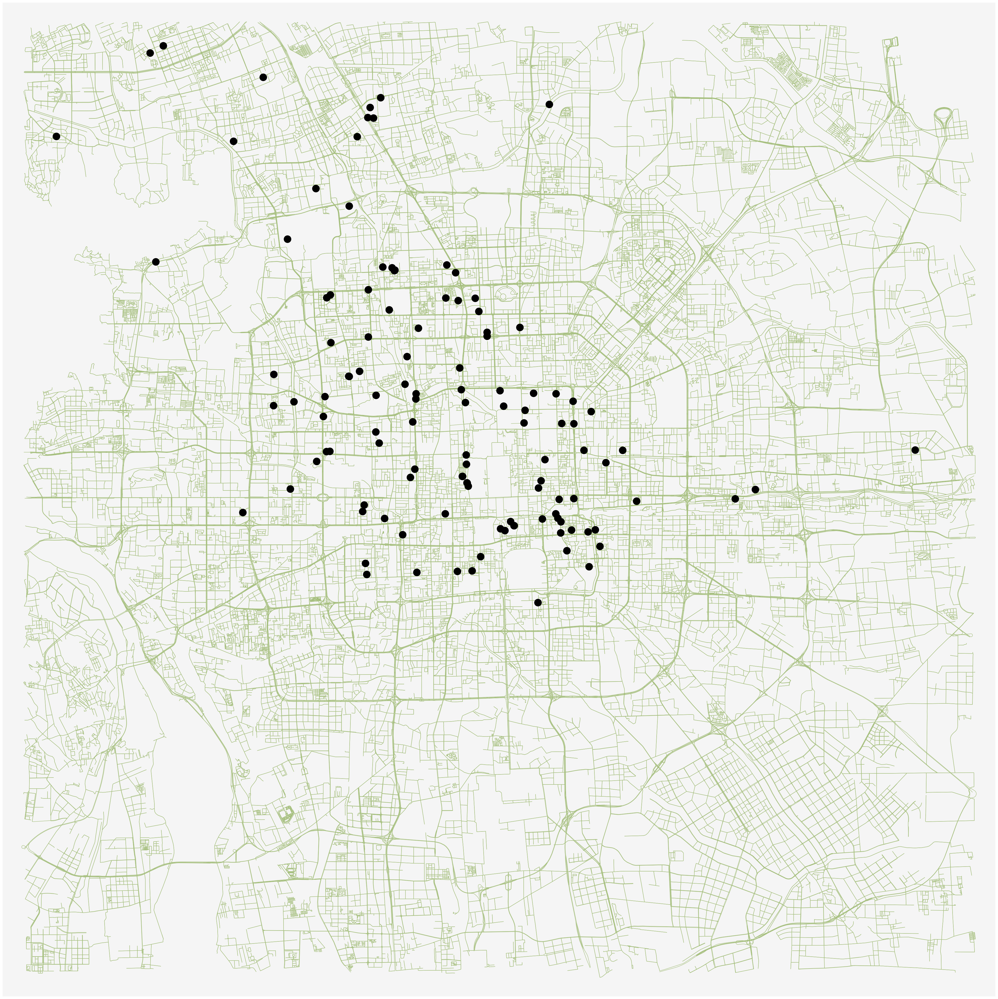

In [13]:
G = ox.load_graphml('E:\桌面\wheel\data\Beijing.graphml')
ox.plot_graph(G, figsize=(50,50),bgcolor="#F5F5F5",node_size=0,edge_color = "#A4BE7B", show=False, close=False)
for j in range(num_points):
    lx = df['lat'][j]
    ly = df['long'][j]
    plt.plot(ly,lx,c='black',marker='o',markersize=20)

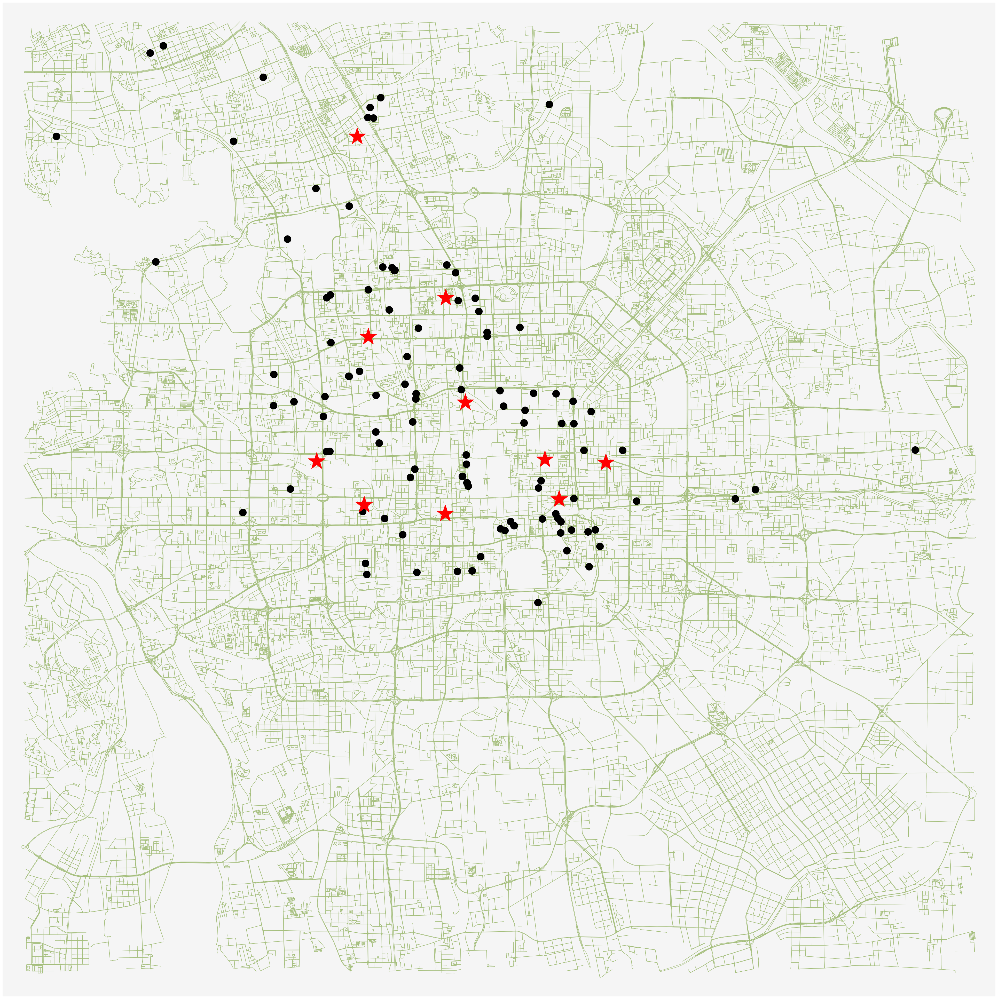

In [16]:
# G = ox.load_graphml('E:\桌面\wheel\data\Beijing.graphml')
ox.plot_graph(G, figsize=(50,50),bgcolor="#F5F5F5",node_size=0,edge_color = "#A4BE7B", show=False, close=False)
for j in range(num_points):
    if j in selected:
        lx = df['lat'][j]
        ly = df['long'][j]
        plt.plot(ly,lx,c='red',marker='*',markersize=50, zorder=3)
    else:
        lx = df['lat'][j]
        ly = df['long'][j]
        plt.plot(ly,lx,c="black",marker='o',markersize=20, zorder=2)